In [1]:
!pip install keras

In [2]:
from tensorflow.keras.layers import Input, Lambda, Dense,Flatten,Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt

In [3]:
train_path="cat-dog-dataset/train"
test_path="cat-dog-dataset/test"
val_path="cat-dog-dataset/val"

In [4]:
'''Image sizes of 224 by 224 are required as input for the VGG-19 model'''
import os
import cv2
x_train=[]
for folder in os.listdir(train_path):
    sub_path=train_path+"/"+folder
    for img in os.listdir(sub_path):
        image_path=sub_path+"/"+img
        img_arr=cv2.imread(image_path)
        img_arr=cv2.resize(img_arr,(224,224))
        x_train.append(img_arr)

In [5]:
image_path

'cat-dog-dataset/train/dog/dog.999.jpg'

In [6]:
x_test=[]
for folder in os.listdir(test_path):
    sub_path=test_path+"/"+folder
    for img in os.listdir(sub_path):
        image_path=sub_path+"/"+img
        img_arr=cv2.imread(image_path)
        img_arr=cv2.resize(img_arr,(224,224))
        x_test.append(img_arr)
x_val=[]
for folder in os.listdir(val_path):
    sub_path=val_path+"/"+folder
    for img in os.listdir(sub_path):
        image_path=sub_path+"/"+img
        img_arr=cv2.imread(image_path)
        img_arr=cv2.resize(img_arr,(224,224))
        x_val.append(img_arr)

In [7]:
# Import the NumPy module
import numpy as np
# Convert the lists into NumPy arrays
train_x=np.array(x_train)
test_x=np.array(x_test)
val_x=np.array(x_val)

In [8]:
#x_test, must be divided by 255.0 for normalization.
test_x=test_x/255.0
#Image sizes of 224 by 224 are required as input for the VGG-19 mode

In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1./255, zoom_range = 0.2,
horizontal_flip = True)
test_datagen = ImageDataGenerator(rescale = 1./255)
val_datagen = ImageDataGenerator(rescale = 1./255)
training_set = train_datagen.flow_from_directory(train_path,target_size
= (224, 224), batch_size = 32, class_mode = 'sparse')

Found 5003 images belonging to 2 classes.


In [10]:
test_set = test_datagen.flow_from_directory(test_path, target_size = (224, 224), batch_size = 32, class_mode = 'sparse')
val_set = val_datagen.flow_from_directory(val_path, target_size = (224, 224), batch_size = 32, class_mode = 'sparse')

Found 1600 images belonging to 2 classes.
Found 400 images belonging to 2 classes.


In [11]:
train_y=training_set.classes
test_y=test_set.classes
val_y=val_set.classes
training_set.class_indices
train_y.shape,test_y.shape,val_y.shape

((5003,), (1600,), (400,))

In [12]:
labels = {value: key for key, value in
training_set.class_indices.items()}
print("Label Mappings for classes present in the training and validation datasets\n")
for key, value in labels.items():
    print(f"{key} : {value}")

Label Mappings for classes present in the training and validation datasets

0 : cat
1 : dog


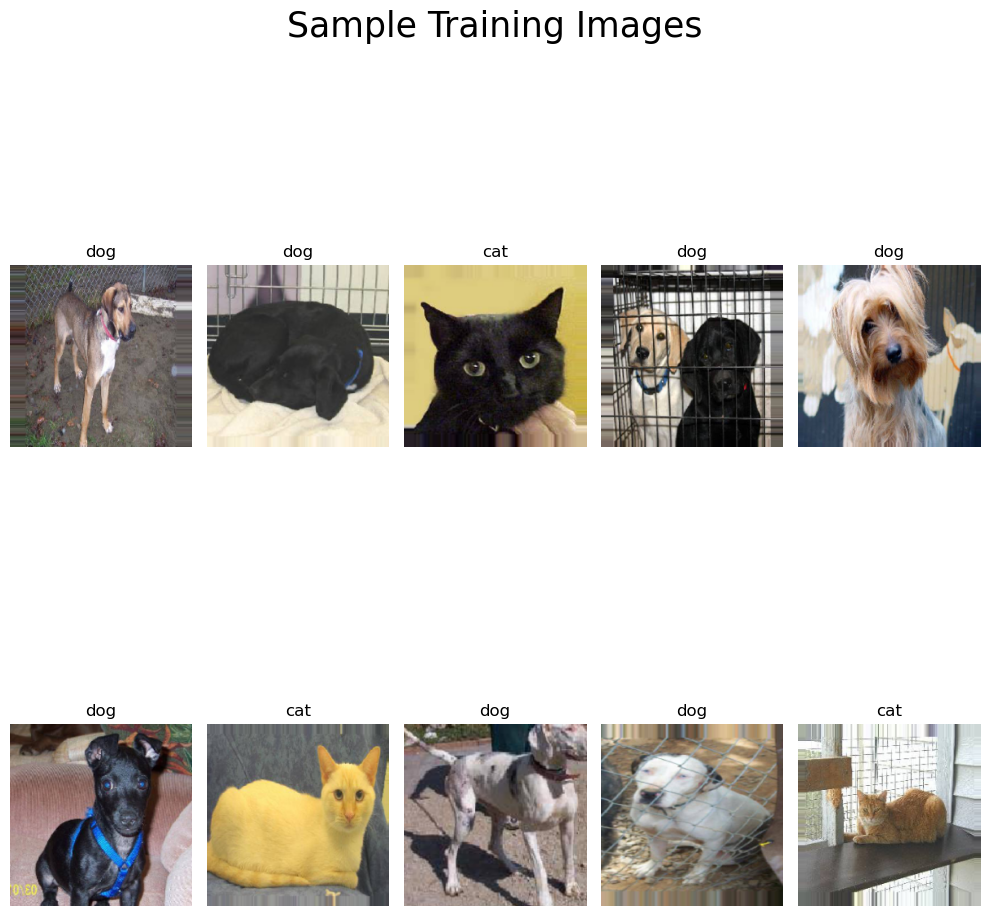

In [15]:
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(10, 12))
idx = 10
for i in range(2):
    for j in range(5):
        label = labels[training_set[0][1][idx]]
        ax[i, j].set_title(f"{label}")
        ax[i, j].imshow(training_set[0][0][idx][:, :, :])
        ax[i, j].axis("off")
        idx += 1
plt.tight_layout()
plt.suptitle("Sample Training Images", fontsize=25)
plt.show()

In [16]:
#All the layers of the VGG model most be set to non-trainable (i.e. layer.trainable = false)

from tensorflow.keras.applications import VGG19
vgg = VGG19(input_shape=(224,224,3), weights='imagenet', include_top=False)
#do not train the pre-trained layers of VGG-19
for layer in vgg.layers:
    layer.trainable = False

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 10s 0us/step


In [17]:
'''Now, to customize the model, we have to change its last layer alone according to
the number of classes in our problem. As we have only two categories, we can
code it this way:'''

from tensorflow.keras.layers import Flatten
x = Flatten()(vgg.output)

In [18]:
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model

#adding output layer.Softmax classifier is used as it is multi-classclassification
prediction = Dense(2, activation='softmax')(x)
model = Model(inputs=vgg.input, outputs=prediction)

# view the structure of the model
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │        50,178 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,074,562 (76.58 MB)

 Trainable params: 50,178 (196.01 KB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [19]:
model.compile( loss='sparse_categorical_crossentropy',optimizer="adam", metrics=['accuracy'])

In [20]:
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
early_stopping_monitor = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)
#Early stopping to avoid overfitting of model

model_file = 'best_vgg_model.keras'
model_check_point = ModelCheckpoint(model_file, monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [21]:
# fit the model
history = model.fit(training_set,validation_data=val_set ,epochs=3,callbacks=[early_stopping_monitor, model_check_point],batch_size=32,shuffle=True)

Epoch 1/3


C:\Users\User\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 15s/step - accuracy: 0.7302 - loss: 0.6996 
Epoch 1: val_loss improved from inf to 0.22112, saving model to best_vgg_model.keras
157/157 ━━━━━━━━━━━━━━━━━━━━ 2491s 16s/step - accuracy: 0.7307 - loss: 0.6979 - val_accuracy: 0.8925 - val_loss: 0.2211
Epoch 2/3
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.8881 - loss: 0.2585 
Epoch 2: val_loss improved from 0.22112 to 0.20203, saving model to best_vgg_model.keras
157/157 ━━━━━━━━━━━━━━━━━━━━ 2262s 14s/step - accuracy: 0.8881 - loss: 0.2585 - val_accuracy: 0.9100 - val_loss: 0.2020
Epoch 3/3
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 14s/step - accuracy: 0.9111 - loss: 0.2160 
Epoch 3: val_loss did not improve from 0.20203
157/157 ━━━━━━━━━━━━━━━━━━━━ 2319s 15s/step - accuracy: 0.9111 - loss: 0.2161 - val_accuracy: 0.8975 - val_loss: 0.2024


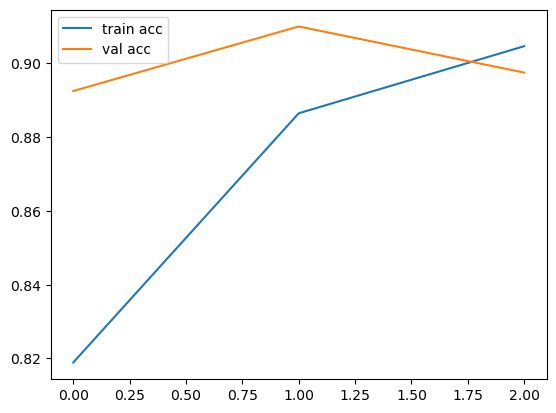

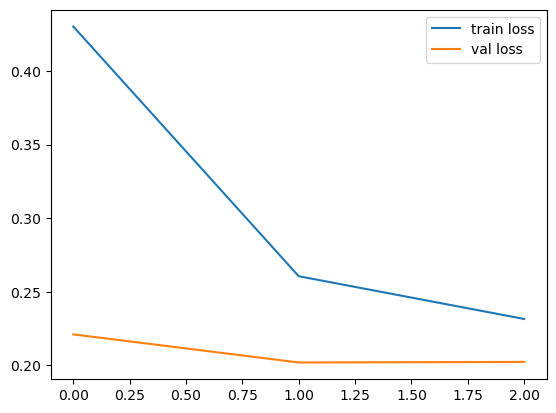

In [22]:
# Import the necessary modules
import matplotlib.pyplot as plt

# Plot the accuracies
plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()

# loss
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.legend()
plt.show()

In [23]:
from keras.models import load_model
model = load_model('best_vgg_model.keras')

# Evaluate the model on the test data
model.evaluate(test_set, batch_size=32)

50/50 ━━━━━━━━━━━━━━━━━━━━ 723s 14s/step - accuracy: 0.9046 - loss: 0.2155


[0.22799184918403625, 0.9024999737739563]

In [25]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
import numpy as np
#predict
y_pred=model.predict(test_x)
y_pred=np.argmax(y_pred,axis=1)
#get classification report
print(classification_report(y_pred, test_y))
#get confusion matrix
print(confusion_matrix(y_pred,test_y))

50/50 ━━━━━━━━━━━━━━━━━━━━ 726s 14s/step
              precision    recall  f1-score   support

           0       0.93      0.88      0.90       851
           1       0.87      0.93      0.90       749

    accuracy                           0.90      1600
   macro avg       0.90      0.90      0.90      1600
weighted avg       0.90      0.90      0.90      1600

[[746 105]
 [ 54 695]]


In [26]:
predictions = model.predict(test_x)

50/50 ━━━━━━━━━━━━━━━━━━━━ 718s 14s/step


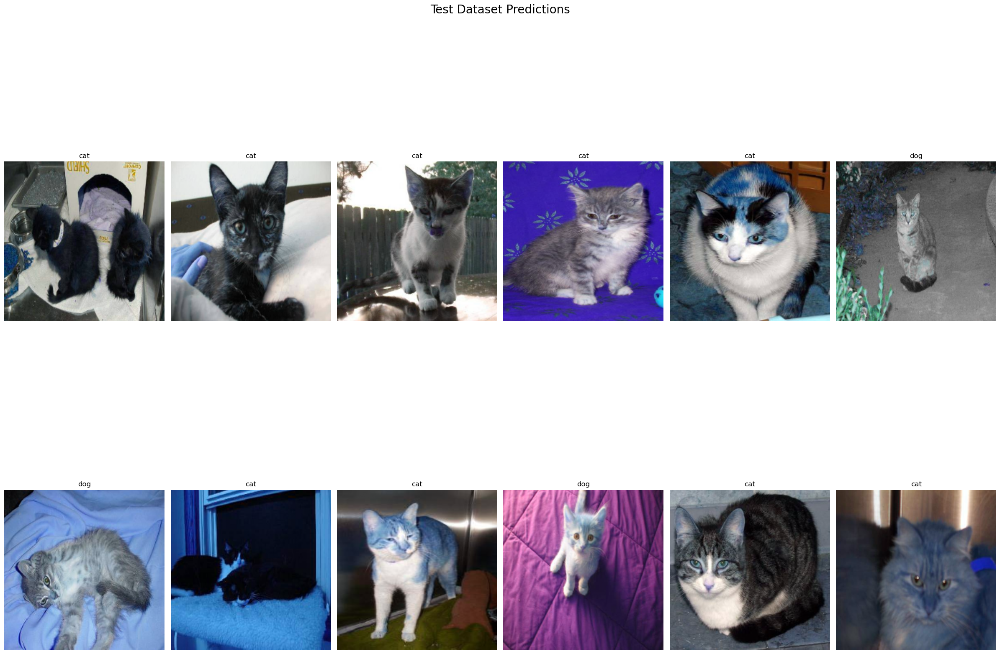

In [27]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=(24, 20))
idx = 10
for i in range(2):
    for j in range(6):
        predicted_label = labels[np.argmax(predictions[idx])]
        ax[i, j].set_title(f"{predicted_label}")
        ax[i, j].imshow(test_x[idx])
        ax[i, j].axis("off")
        idx += 1
plt.tight_layout()
plt.suptitle("Test Dataset Predictions", fontsize=20)
plt.show()

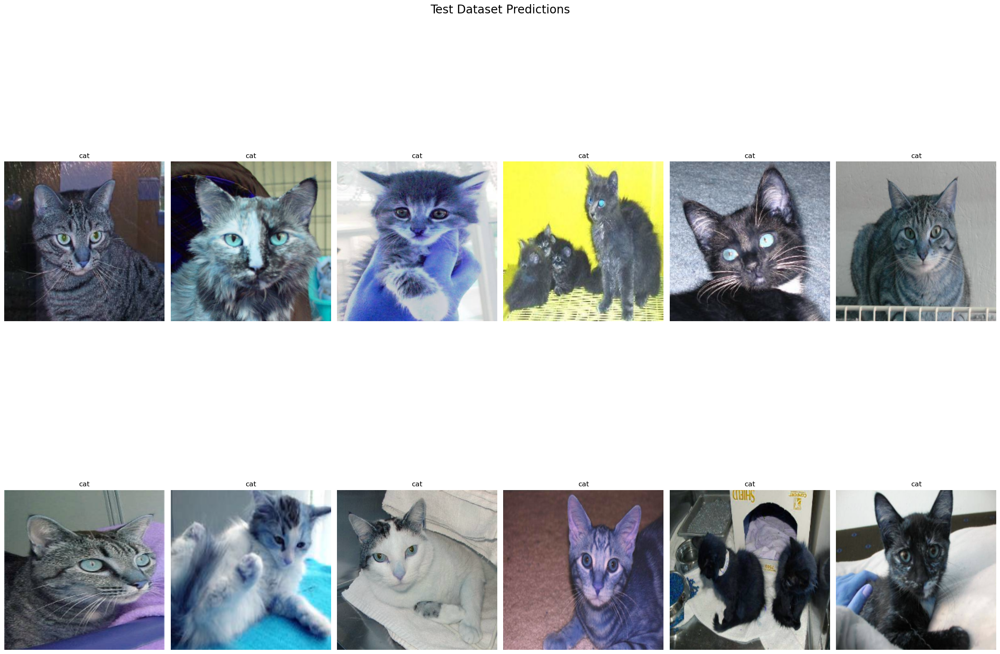

In [28]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=(24, 20))
idx = 0
for i in range(2):
    for j in range(6):
        predicted_label = labels[np.argmax(predictions[idx])]
        ax[i, j].set_title(f"{predicted_label}")
        ax[i, j].imshow(test_x[idx])
        ax[i, j].axis("off")
        idx += 1
plt.tight_layout()
plt.suptitle("Test Dataset Predictions", fontsize=20)
plt.show()

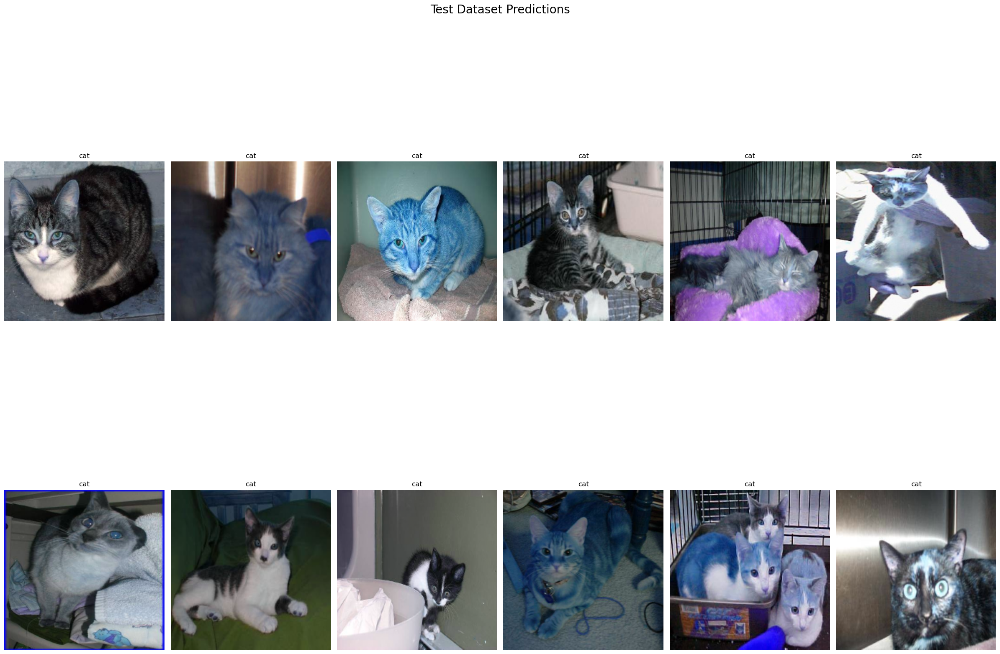

In [29]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=(24, 20))
idx = 20
for i in range(2):
    for j in range(6):
        predicted_label = labels[np.argmax(predictions[idx])]
        ax[i, j].set_title(f"{predicted_label}")
        ax[i, j].imshow(test_x[idx])
        ax[i, j].axis("off")
        idx += 1
plt.tight_layout()
plt.suptitle("Test Dataset Predictions", fontsize=20)
plt.show()